### Computational Applications OF Artificial Intelligence

### Module Code: CS4S773

# Title:  Augmentation Techniques and Model Performance Analysis

# 

###  Importing libraries

In [43]:
# Importing libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from collections import Counter
import tensorflow as tf
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
from tensorflow.keras.preprocessing.image import ImageDataGenerator

### Loading the dataset

In [44]:
IMG_SIZE = 128  # Target image size (width, height)
classes = ["buffalo", "elephants", "giraffes", "rhinos", "zebras"]  # Classes from dataset
data_dir = r"C:\Users\kazan\Downloads\WildAfrica"  # Path to the dataset folder

# Initializing empty lists for images and labels
images = []
labels = []
image_sizes = []
file_formats = []

### Processing images 

In [45]:
# Processing images
for class_index, class_name in enumerate(classes):
    class_path = os.path.join(data_dir, class_name)
    for img_file in os.listdir(class_path):
        if img_file.endswith(('.jpg', '.jpeg', '.png')):  # Supported file types
            img_path = os.path.join(class_path, img_file)
            img = cv2.imread(img_path)  # Reading the image
            if img is not None:  # Ensuring the image is loaded correctly
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Converting to RGB
                image_sizes.append(img.shape[:2])  # Saving original size (height, width)
                file_formats.append(os.path.splitext(img_file)[1].lower())  # Saving file format
                images.append(cv2.resize(img, (IMG_SIZE, IMG_SIZE)))  # Resizing image
                labels.append(class_index)  # Assigning class label

# Converting to NumPy arrays
images = np.array(images)
labels = np.array(labels)

### Collecting information regarding the dataset

In [46]:
# Displaying number of images per class
class_counts = Counter(labels)
print("Number of images per class:")
for class_name, count in zip(classes, [class_counts[i] for i in range(len(classes))]):
    print(f"{class_name}: {count} images")

Number of images per class:
buffalo: 179 images
elephants: 119 images
giraffes: 27 images
rhinos: 109 images
zebras: 49 images


### Generating a bar chart for class distribution

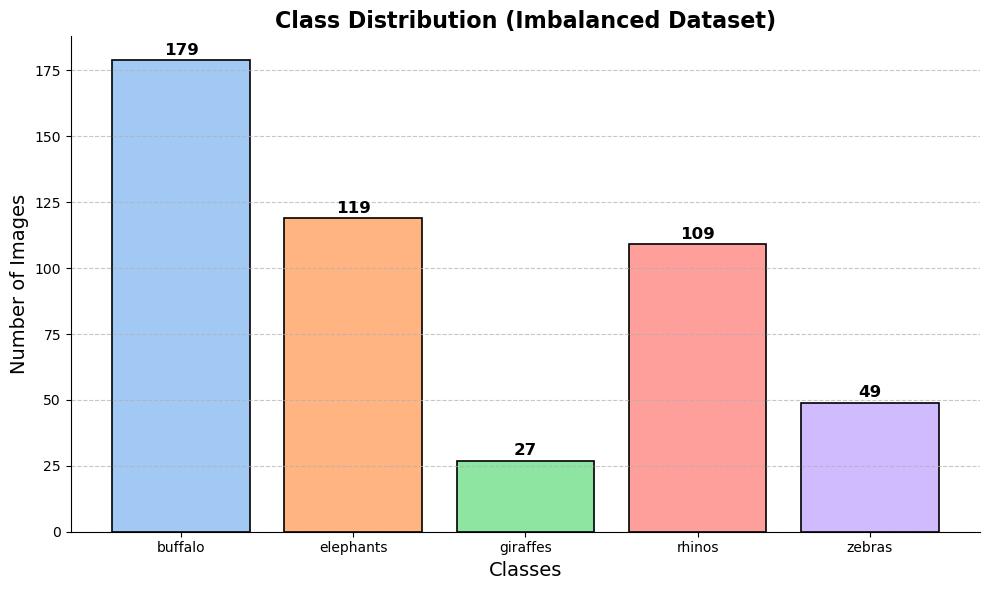

In [47]:
# Extracting class names and their counts
class_names = [classes[i] for i in range(len(classes))]
class_counts_values = [class_counts[i] for i in range(len(classes))]

# Setting a colour palette
colors = sns.color_palette("pastel", len(classes))

# Creating the bar chart
plt.figure(figsize=(10, 6))
bars = plt.bar(class_names, class_counts_values, color=colors, edgecolor='black', linewidth=1.2)

# Adding titles and labels
plt.title('Class Distribution (Imbalanced Dataset)', fontsize=16, fontweight='bold')
plt.xlabel('Classes', fontsize=14)
plt.ylabel('Number of Images', fontsize=14)

# Adding counts on top of bars
for bar, count in zip(bars, class_counts_values):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 2, str(count),
             ha='center', fontsize=12, fontweight='bold')

# Enhancing aesthetics
sns.despine()  # Removes top and right spines
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Display the chart
plt.tight_layout()
plt.show()

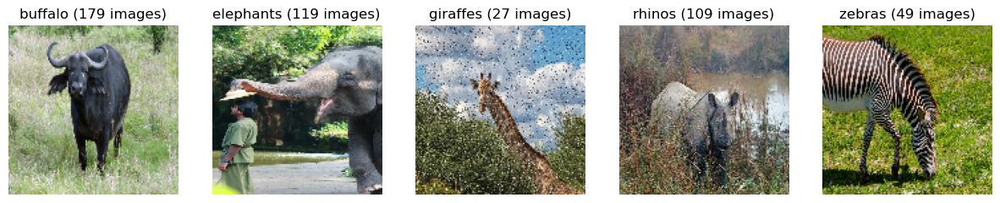

In [48]:
# Displaying sample images from each class
plt.figure(figsize=(15, 10))
for i, class_name in enumerate(classes):
    class_images = [images[idx] for idx, label in enumerate(labels) if label == i]
    plt.subplot(1, len(classes), i + 1)
    plt.imshow(class_images[0])  # Displaying the first image of the class
    plt.title(f"{class_name} ({len(class_images)} images)")
    plt.axis("off")
plt.show()

In [51]:
# Analyzing original image sizes
unique_sizes = Counter(image_sizes)
print("\nOriginal image sizes (height, width) and their counts:")
for size, count in unique_sizes.items():
    print(f"Size: {size}, Count: {count}")


Original image sizes (height, width) and their counts:
Size: (415, 623), Count: 1
Size: (400, 600), Count: 12
Size: (1047, 1920), Count: 1
Size: (343, 500), Count: 1
Size: (380, 500), Count: 1
Size: (768, 1024), Count: 6
Size: (353, 450), Count: 1
Size: (400, 300), Count: 1
Size: (200, 299), Count: 1
Size: (480, 852), Count: 6
Size: (600, 900), Count: 2
Size: (390, 590), Count: 1
Size: (697, 1000), Count: 1
Size: (251, 384), Count: 1
Size: (200, 300), Count: 2
Size: (160, 200), Count: 1
Size: (653, 1024), Count: 1
Size: (674, 1024), Count: 1
Size: (150, 227), Count: 2
Size: (380, 600), Count: 1
Size: (440, 600), Count: 2
Size: (450, 600), Count: 3
Size: (150, 242), Count: 1
Size: (150, 200), Count: 2
Size: (416, 786), Count: 1
Size: (797, 795), Count: 1
Size: (239, 184), Count: 1
Size: (1600, 2560), Count: 1
Size: (540, 960), Count: 4
Size: (471, 640), Count: 1
Size: (1236, 1920), Count: 1
Size: (800, 1200), Count: 6
Size: (668, 1024), Count: 1
Size: (351, 406), Count: 1
Size: (157, 2

In [52]:
# Analyzing file formats
format_counts = Counter(file_formats)
print("\nFile formats and their counts:")
for file_format, count in format_counts.items():
    print(f"Format: {file_format}, Count: {count}")


File formats and their counts:
Format: .jpg, Count: 483


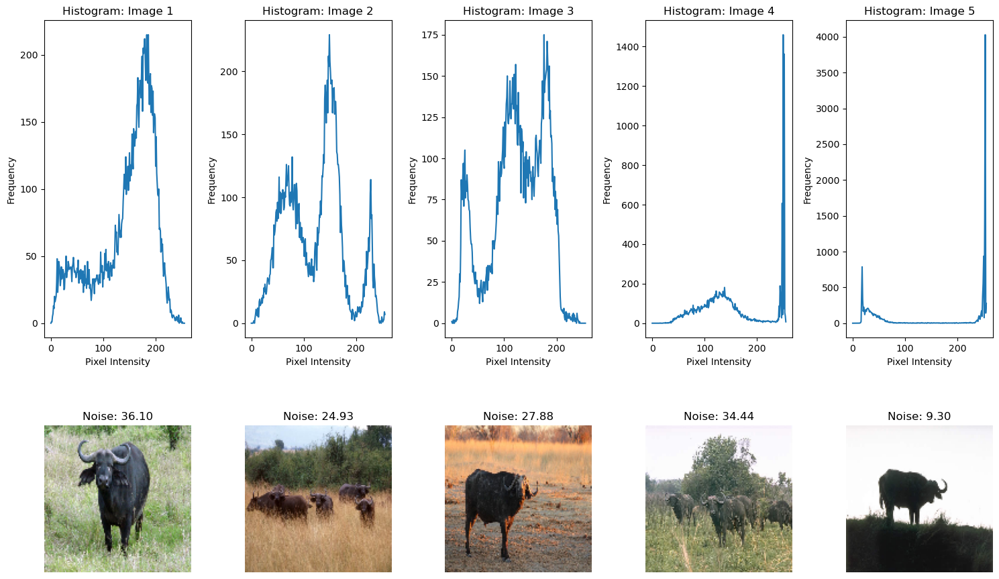


Noise levels (mean pixel differences):
Image 1: 36.10
Image 2: 24.93
Image 3: 27.88
Image 4: 34.44
Image 5: 9.30


In [54]:
def calculate_pixel_difference(img):
    # Calculating the mean pixel difference between adjacent pixels
    vertical_diff = np.abs(np.diff(img.astype(np.int32), axis=0))  # Vertical pixel differences
    horizontal_diff = np.abs(np.diff(img.astype(np.int32), axis=1))  # Horizontal pixel differences
    # Removing the last row from the horizontal differences to match the shapes
    combined_diff = vertical_diff[:, :-1] + horizontal_diff[:-1, :]
    return np.mean(combined_diff)

# Noise detection (analyzing histogram and pixel differences)
noise_levels = []
plt.figure(figsize=(15, 10))
for i, img in enumerate(images[:5]):  # Analyze a few images
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)  # Convert to grayscale
    histogram = cv2.calcHist([gray], [0], None, [256], [0, 256])  # Calculate histogram
    noise_level = calculate_pixel_difference(gray)  # Oblicz wskaźnik szumu
    noise_levels.append(noise_level)
    
    # Displaying histogram
    plt.subplot(2, 5, i + 1)
    plt.plot(histogram)
    plt.title(f"Histogram: Image {i+1}")
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")
    
    # Displaying image with noise level
    plt.subplot(2, 5, i + 6)
    plt.imshow(img)
    plt.title(f"Noise: {noise_level:.2f}")
    plt.axis("off")
plt.tight_layout()
plt.show()

# Summary of noise levels
print("\nNoise levels (mean pixel differences):")
for i, noise_level in enumerate(noise_levels):
    print(f"Image {i+1}: {noise_level:.2f}")

# Basic training preperation stage

### Normalizing pixel values

In [55]:
# Normalizing pixel values
images = images / 255.0 # Scale to [0, 1]

### Splitting the dataset into training and testing sets

In [56]:
# Spliting data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=0.2, random_state=42)

### Defining the CNN model

C:\Users\kazan\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - accuracy: 0.3310 - loss: 1.8493 - val_accuracy: 0.3918 - val_loss: 1.4090
Epoch 2/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 123ms/step - accuracy: 0.4314 - loss: 1.4171 - val_accuracy: 0.4227 - val_loss: 1.4104
Epoch 3/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 114ms/step - accuracy: 0.4620 - loss: 1.2899 - val_accuracy: 0.4536 - val_loss: 1.2291
Epoch 4/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 115ms/step - accuracy: 0.5442 - loss: 1.0361 - val_accuracy: 0.6289 - val_loss: 1.2025
Epoch 5/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 117ms/step - accuracy: 0.6019 - loss: 0.9710 - val_accuracy: 0.4227 - val_loss: 1.3354
Epoch 6/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - accuracy: 0.6277 - loss: 0.8676 - val_accuracy: 0.6082 - val_loss: 1.1056
Epoch 7/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 123ms/step - accuracy: 0.7027 - loss: 0.7788 - val_accuracy: 0.6082 - val_loss: 1.1588
Epoch 8/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 122ms/step - accuracy: 0.7656 - loss: 0.6850 - val_accuracy: 0.

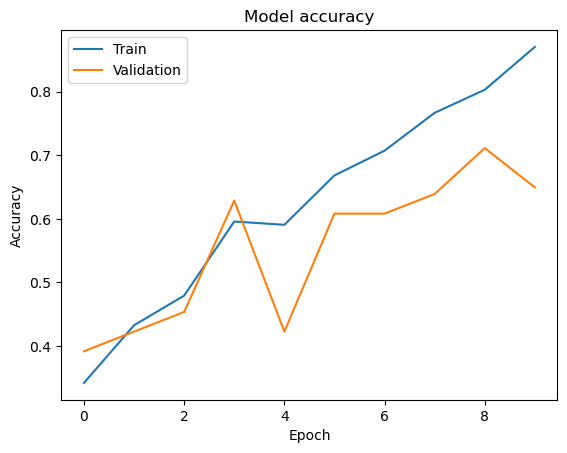

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


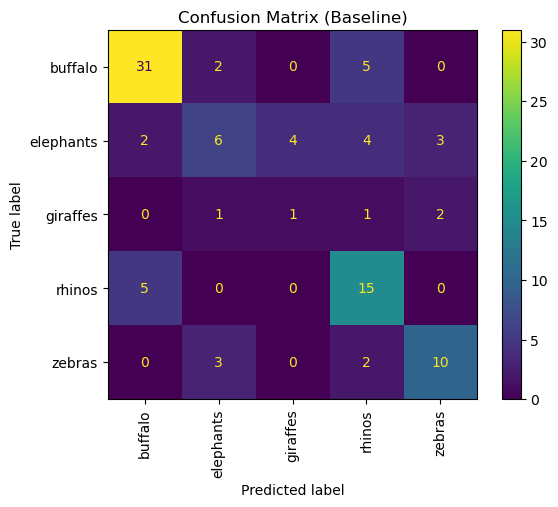

Classification Report:

              precision    recall  f1-score   support

     buffalo       0.82      0.82      0.82        38
   elephants       0.50      0.32      0.39        19
    giraffes       0.20      0.20      0.20         5
      rhinos       0.56      0.75      0.64        20
      zebras       0.67      0.67      0.67        15

    accuracy                           0.65        97
   macro avg       0.55      0.55      0.54        97
weighted avg       0.65      0.65      0.64        97



In [11]:
# Define the CNN model--- you will not need to adopt this code- dont change the models at all.
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(IMG_SIZE, IMG_SIZE, 3)))  # Use IMG_SIZE here
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.Flatten())
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dense(10, activation='softmax'))  # Assuming 10 classes


# Compiling the model
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Training the model
history = model.fit(X_train, y_train, epochs=10, validation_data=(X_test, y_test))

# Evaluating the model
test_loss, test_acc = model.evaluate(X_test, y_test, verbose=2)
print('\nTest accuracy:', test_acc)

# Ploting the training and validation accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Model Predictions on the test dataset
y_pred = np.argmax(model.predict(X_test), axis=1)  # Predicting probabilities and converting them to class labels

# Computing the confusion matrix
cm = confusion_matrix(y_test, y_pred)  # Comparing true labels with predicted labels

# Displaying the confusion matrix with class names
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)  # Visual representation of confusion matrix
disp.plot(cmap='viridis', xticks_rotation='vertical')  # Using a colour map for better readability
plt.title('Confusion Matrix (Baseline)') 
plt.show()  # Displaying the confusion matrix plot

# Generating the classification report (detailed performance metrics)
report = classification_report(y_test, y_pred, target_names=classes)  # Summarising precision, recall, F1-score
print("Classification Report:\n")  # Printing a heading for the report
print(report)  # Displaying the classification report in the console

# Fase Two (data augmentation)

### Applying data augmentation

### Oversampling

Initial class distribution: Counter({0: 179, 1: 119, 3: 109, 4: 49, 2: 27})
Pixel range before normalization: 0.0 1.0
Pixel range after normalization: 0.0 1.0
Balanced class distribution: Counter({0: 179, 1: 179, 2: 179, 3: 179, 4: 179})
Shape of balanced_images: (895, 128, 128, 3)
Training set shape: (716, 128, 128, 3)
Test set shape: (179, 128, 128, 3)


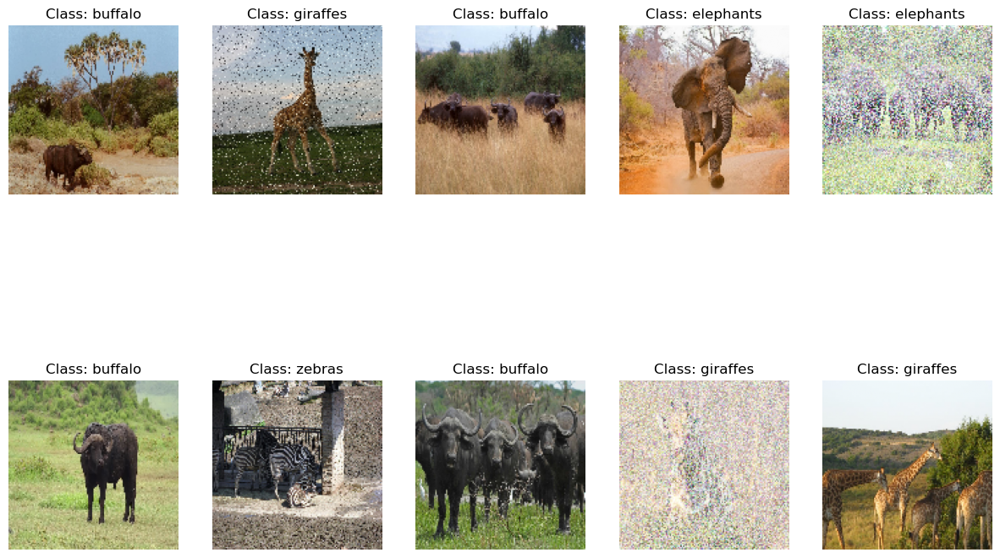

In [12]:
# Analysing class distribution
class_counts = Counter(labels)
print("Initial class distribution:", class_counts)

# Determine the target size (size of the largest class)
max_count = max(class_counts.values())

# Oversampling
balanced_images = []
balanced_labels = []

for class_index in range(len(classes)):
    class_images = [images[i] for i in range(len(images)) if labels[i] == class_index]
    class_labels = [labels[i] for i in range(len(labels)) if labels[i] == class_index]
    
    # Oversampling the class
    while len(class_images) < max_count:
        idx = np.random.randint(len(class_images))  # Randomly select an image
        class_images.append(class_images[idx])
        class_labels.append(class_labels[idx])
    
    balanced_images.extend(class_images)
    balanced_labels.extend(class_labels)

# Converting to NumPy arrays
balanced_images = np.array(balanced_images)
balanced_labels = np.array(balanced_labels)

# Debugging pixel range
print("Pixel range before normalization:", balanced_images.min(), balanced_images.max())

# Ensuring pixel values are in the correct range
if balanced_images.max() > 1.0:
    balanced_images = balanced_images / 255.0  # Normalize to [0, 1]

# Debugging pixel range after normalization
print("Pixel range after normalization:", balanced_images.min(), balanced_images.max())

# Analysing new distribution
new_class_counts = Counter(balanced_labels)
print("Balanced class distribution:", new_class_counts)

# Splitting the balanced dataset into training and test sets
X_train_balanced, X_test_balanced, y_train_balanced, y_test_balanced = train_test_split(
    balanced_images, balanced_labels, test_size=0.2, random_state=42)

# Debugging dataset dimensions
print("Shape of balanced_images:", balanced_images.shape)
print("Training set shape:", X_train_balanced.shape)
print("Test set shape:", X_test_balanced.shape)

# Displaying a few examples from the balanced dataset
plt.figure(figsize=(15, 10))
for i in range(10):  # Display 10 random images
    idx = np.random.randint(len(X_train_balanced))
    plt.subplot(2, 5, i + 1)
    plt.imshow(X_train_balanced[idx])
    plt.title(f"Class: {classes[y_train_balanced[idx]]}")
    plt.axis("off")
plt.show()

### Defining the Model to use in future tests

In [13]:
# Creating a Base CNN model
def create_model():
    model = models.Sequential([
        layers.Conv2D(32, (3, 3), activation='relu', input_shape=(IMG_SIZE, IMG_SIZE, 3)),
        layers.MaxPooling2D((2, 2)),
        layers.Conv2D(64, (3, 3), activation='relu'),
        layers.MaxPooling2D((2, 2)),
        layers.Conv2D(64, (3, 3), activation='relu'),
        layers.Flatten(),
        layers.Dense(64, activation='relu'),
        layers.Dense(10, activation='softmax')  # Assuming 10 classes
    ])
    model.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])
    return model

### Create a Base CNN model for oversampled baseline

Epoch 1/10


C:\Users\kazan\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 5s 137ms/step - accuracy: 0.2912 - loss: 1.9345 - val_accuracy: 0.6313 - val_loss: 1.1651
Epoch 2/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - accuracy: 0.5866 - loss: 1.0773 - val_accuracy: 0.5587 - val_loss: 0.9872
Epoch 3/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - accuracy: 0.7093 - loss: 0.7825 - val_accuracy: 0.7821 - val_loss: 0.6252
Epoch 4/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - accuracy: 0.8128 - loss: 0.4741 - val_accuracy: 0.7542 - val_loss: 0.6614
Epoch 5/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - accuracy: 0.8583 - loss: 0.3908 - val_accuracy: 0.7542 - val_loss: 0.5760
Epoch 6/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 121ms/step - accuracy: 0.9125 - loss: 0.2744 - val_accuracy: 0.8492 - val_loss: 0.4815
Epoch 7/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - accuracy: 0.9492 - loss: 0.1972 - val_accuracy: 0.8268 - val_loss: 0.5334
Epoch 8/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - accuracy: 0.9269 - loss: 0.2154 - val_accuracy: 0.8324 - val_

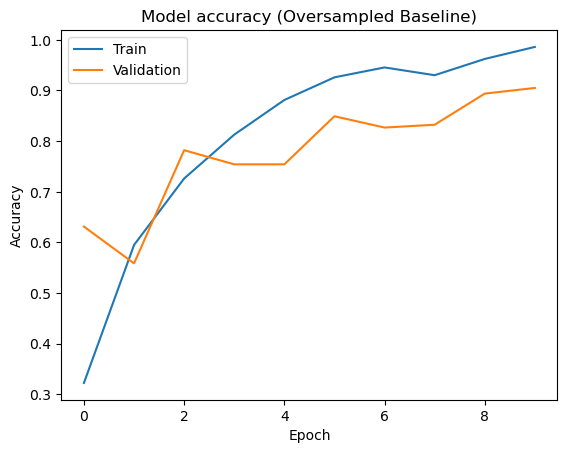

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


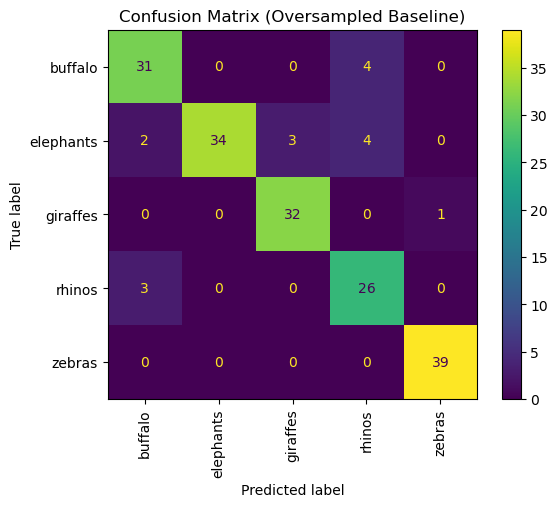

Classification Report (Oversampled Baseline):

              precision    recall  f1-score   support

     buffalo       0.86      0.89      0.87        35
   elephants       1.00      0.79      0.88        43
    giraffes       0.91      0.97      0.94        33
      rhinos       0.76      0.90      0.83        29
      zebras       0.97      1.00      0.99        39

    accuracy                           0.91       179
   macro avg       0.90      0.91      0.90       179
weighted avg       0.91      0.91      0.91       179



In [14]:
# Creating a Base CNN model for oversampled baseline
model_oversampled_baseline = create_model()

# Training the model on the balanced dataset
history_oversampled_baseline = model_oversampled_baseline.fit(
    X_train_balanced, y_train_balanced, epochs=10, validation_data=(X_test_balanced, y_test_balanced)
)

# Evaluating the model
test_loss_oversampled, test_acc_oversampled = model_oversampled_baseline.evaluate(X_test_balanced, y_test_balanced, verbose=2)
print('\nTest accuracy (Oversampled Baseline):', test_acc_oversampled)

# Plotting the training and validation accuracy
plt.plot(history_oversampled_baseline.history['accuracy'])
plt.plot(history_oversampled_baseline.history['val_accuracy'])
plt.title('Model accuracy (Oversampled Baseline)')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Model Predictions on the balanced test dataset
y_pred_oversampled = np.argmax(model_oversampled_baseline.predict(X_test_balanced), axis=1)

# Computing the confusion matrix
cm_oversampled = confusion_matrix(y_test_balanced, y_pred_oversampled)

# Displaying the confusion matrix with class names
disp_oversampled = ConfusionMatrixDisplay(confusion_matrix=cm_oversampled, display_labels=classes)
disp_oversampled.plot(cmap='viridis', xticks_rotation='vertical')
plt.title('Confusion Matrix (Oversampled Baseline)')
plt.show()

# Generating the classification report
report_oversampled = classification_report(y_test_balanced, y_pred_oversampled, target_names=classes)
print("Classification Report (Oversampled Baseline):\n")
print(report_oversampled)

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


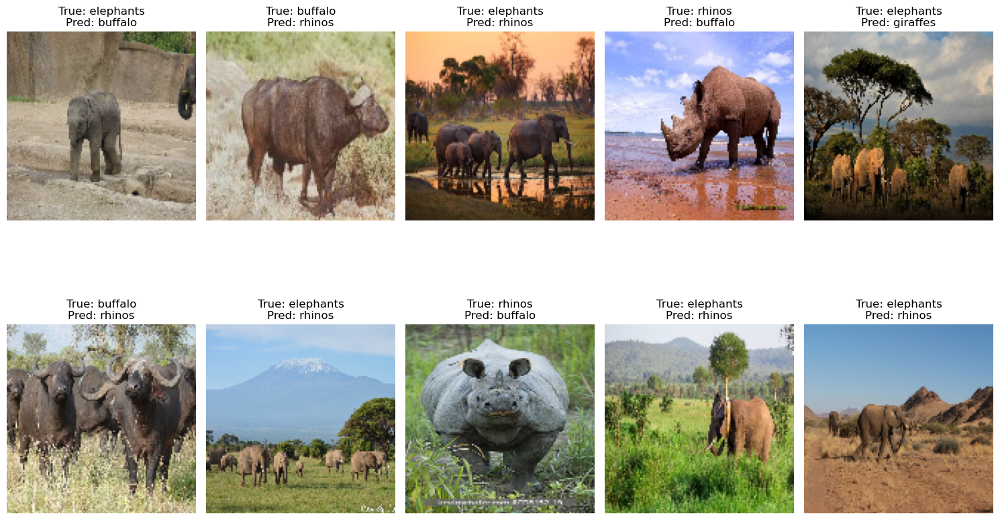

Misclassifications between classes:
True: elephants, Predicted: buffalo - Count: 2
True: buffalo, Predicted: rhinos - Count: 4
True: elephants, Predicted: rhinos - Count: 4
True: rhinos, Predicted: buffalo - Count: 3
True: elephants, Predicted: giraffes - Count: 3
True: giraffes, Predicted: zebras - Count: 1


In [16]:
# Getting predictions for misclassified images
y_pred = np.argmax(model_oversampled_baseline.predict(X_test_balanced), axis=1)

# Identifying misclassified images
misclassified_indices = np.where(y_pred != y_test_balanced)[0]  # Indices of misclassified samples

# Displaying misclassified images
plt.figure(figsize=(15, 10))
for i, idx in enumerate(misclassified_indices[:10]):  # Displaying the first 10 misclassified samples
    plt.subplot(2, 5, i + 1)
    plt.imshow(X_test_balanced[idx])
    plt.title(f"True: {classes[y_test_balanced[idx]]}\nPred: {classes[y_pred[idx]]}")
    plt.axis("off")
plt.tight_layout()
plt.show()

# Counting misclassifications for each class pair
from collections import Counter
misclassified_pairs = [(classes[y_test_balanced[idx]], classes[y_pred[idx]]) for idx in misclassified_indices]
misclassified_count = Counter(misclassified_pairs)

print("Misclassifications between classes:")
for (true_class, pred_class), count in misclassified_count.items():
    print(f"True: {true_class}, Predicted: {pred_class} - Count: {count}")

# Augmentation Methods on CNN model

### Creating a new model with Gaussian Noise

Adding Gaussian Noise to the oversampled dataset...
Visualizing Gaussian Noise Augmentation...


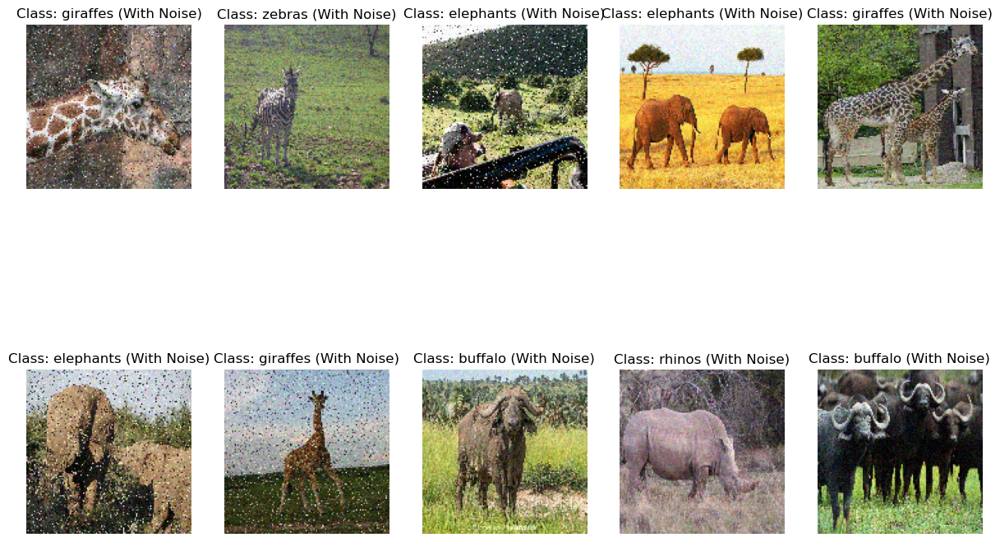

Training the model with Gaussian Noise...
Epoch 1/10


C:\Users\kazan\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - accuracy: 0.2468 - loss: 1.7873 - val_accuracy: 0.5698 - val_loss: 1.3301
Epoch 2/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 121ms/step - accuracy: 0.6428 - loss: 0.9258 - val_accuracy: 0.7151 - val_loss: 0.6859
Epoch 3/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - accuracy: 0.8035 - loss: 0.5895 - val_accuracy: 0.8101 - val_loss: 0.6022
Epoch 4/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - accuracy: 0.8487 - loss: 0.3763 - val_accuracy: 0.8212 - val_loss: 0.5931
Epoch 5/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - accuracy: 0.9371 - loss: 0.2257 - val_accuracy: 0.8771 - val_loss: 0.3731
Epoch 6/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - accuracy: 0.9684 - loss: 0.1344 - val_accuracy: 0.8380 - val_loss: 0.4965
Epoch 7/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 117ms/step - accuracy: 0.9465 - loss: 0.1422 - val_accuracy: 0.8827 - val_loss: 0.4179
Epoch 8/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 117ms/step - accuracy: 0.9914 - loss: 0.0476 - val_accuracy: 0.8827 - val_

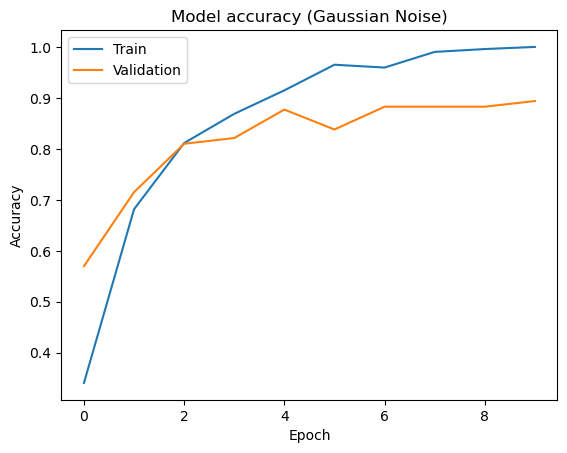

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


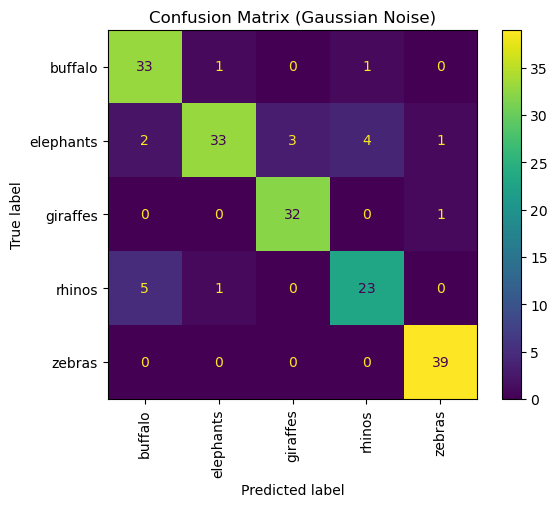

Classification Report (Gaussian Noise):

              precision    recall  f1-score   support

     buffalo       0.82      0.94      0.88        35
   elephants       0.94      0.77      0.85        43
    giraffes       0.91      0.97      0.94        33
      rhinos       0.82      0.79      0.81        29
      zebras       0.95      1.00      0.97        39

    accuracy                           0.89       179
   macro avg       0.89      0.89      0.89       179
weighted avg       0.90      0.89      0.89       179



In [18]:
# Creating a new model with Gaussian Noise
print("Adding Gaussian Noise to the oversampled dataset...")
X_train_noise = X_train_balanced + np.random.normal(0, 0.05, X_train_balanced.shape)  # Mean 0, std dev 0.05
X_test_noise = X_test_balanced + np.random.normal(0, 0.05, X_test_balanced.shape)

# Clipping pixel values to range [0, 1]
X_train_noise = np.clip(X_train_noise, 0, 1)
X_test_noise = np.clip(X_test_noise, 0, 1)

# Visualizing noisy images
print("Visualizing Gaussian Noise Augmentation...")
plt.figure(figsize=(15, 10))
for i in range(10):  # Display 10 examples
    idx = np.random.randint(len(X_train_noise))
    plt.subplot(2, 5, i + 1)
    plt.imshow(X_train_noise[idx])
    plt.title(f"Class: {classes[y_train_balanced[idx]]} (With Noise)")
    plt.axis("off")
plt.show()

# Training the model on the noisy dataset
print("Training the model with Gaussian Noise...")
model_gaussian = create_model()
history_gaussian = model_gaussian.fit(X_train_noise, y_train_balanced, epochs=10, validation_data=(X_test_noise, y_test_balanced))

# Evaluating the model
test_loss_gaussian, test_acc_gaussian = model_gaussian.evaluate(X_test_noise, y_test_balanced)
print(f'\nTest accuracy (Gaussian Noise): {test_acc_gaussian}')

# Plotting training and validation accuracy
plt.plot(history_gaussian.history['accuracy'])
plt.plot(history_gaussian.history['val_accuracy'])
plt.title('Model accuracy (Gaussian Noise)')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Predictions on noisy test dataset
y_pred_gaussian = np.argmax(model_gaussian.predict(X_test_noise), axis=1)

# Confusion Matrix for noisy test data
cm_gaussian = confusion_matrix(y_test_balanced, y_pred_gaussian)

# Displaying confusion matrix
disp_gaussian = ConfusionMatrixDisplay(confusion_matrix=cm_gaussian, display_labels=classes)
disp_gaussian.plot(cmap='viridis', xticks_rotation='vertical')
plt.title('Confusion Matrix (Gaussian Noise)')
plt.show()

# Classification Report
report_gaussian = classification_report(y_test_balanced, y_pred_gaussian, target_names=classes)
print("Classification Report (Gaussian Noise):\n")
print(report_gaussian)

### Creating a new model with Random Flip Augmentation

Applying Random Flip Augmentation to the oversampled dataset...
Visualizing Random Flip Augmentation...


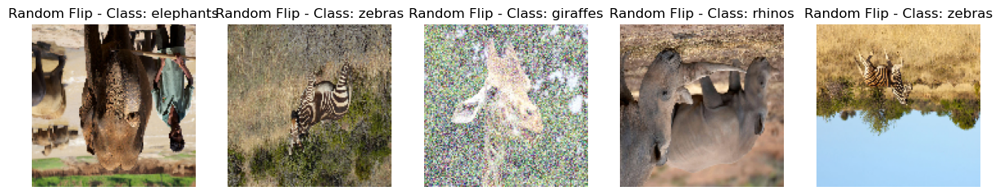

Training the model with Random Flip Augmentation...
Epoch 1/10


C:\Users\kazan\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 6s 142ms/step - accuracy: 0.2118 - loss: 1.9328 - val_accuracy: 0.4302 - val_loss: 1.2194
Epoch 2/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - accuracy: 0.5102 - loss: 1.1575 - val_accuracy: 0.6313 - val_loss: 0.9675
Epoch 3/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 122ms/step - accuracy: 0.6805 - loss: 0.8583 - val_accuracy: 0.6369 - val_loss: 0.8076
Epoch 4/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - accuracy: 0.7844 - loss: 0.5538 - val_accuracy: 0.7765 - val_loss: 0.6546
Epoch 5/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - accuracy: 0.8290 - loss: 0.4450 - val_accuracy: 0.7933 - val_loss: 0.6419
Epoch 6/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - accuracy: 0.8924 - loss: 0.3596 - val_accuracy: 0.7598 - val_loss: 0.7542
Epoch 7/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 122ms/step - accuracy: 0.9086 - loss: 0.2714 - val_accuracy: 0.7598 - val_loss: 0.7855
Epoch 8/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - accuracy: 0.9563 - loss: 0.1618 - val_accuracy: 0.7374 - val_

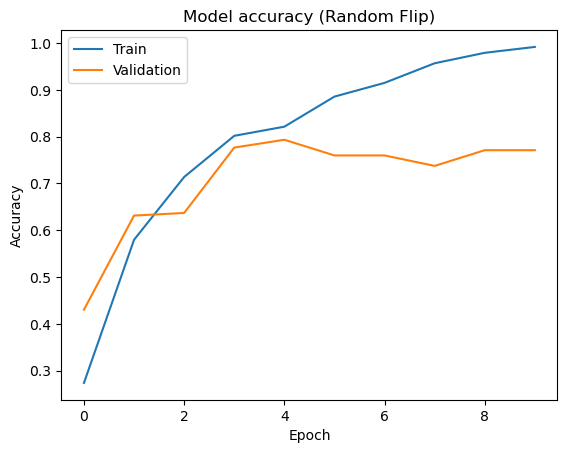

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


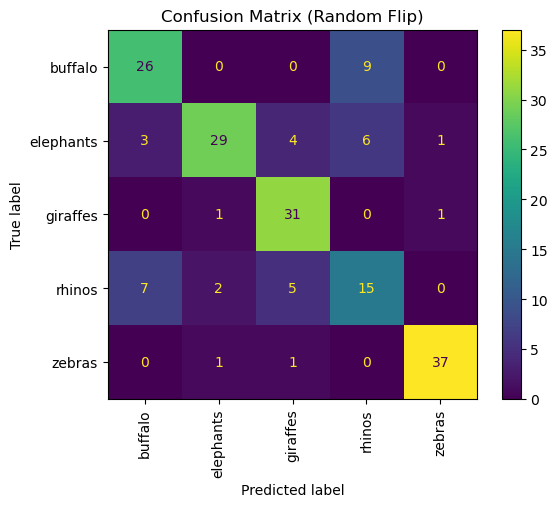

Classification Report (Random Flip):

              precision    recall  f1-score   support

     buffalo       0.72      0.74      0.73        35
   elephants       0.88      0.67      0.76        43
    giraffes       0.76      0.94      0.84        33
      rhinos       0.50      0.52      0.51        29
      zebras       0.95      0.95      0.95        39

    accuracy                           0.77       179
   macro avg       0.76      0.76      0.76       179
weighted avg       0.78      0.77      0.77       179



In [19]:
# Random Flip Augmentation
data_flip = tf.keras.Sequential([
    layers.RandomFlip("horizontal_and_vertical")  # Random horizontal and vertical flipping
])

# Augmenting the oversampled dataset with Random Flip
print("Applying Random Flip Augmentation to the oversampled dataset...")
augmented_images_flip = []
augmented_labels_flip = []

for img, label in zip(X_train_balanced, y_train_balanced):
    img_augmented = data_flip(tf.expand_dims(img, axis=0))[0].numpy()
    augmented_images_flip.append(img_augmented)
    augmented_labels_flip.append(label)

# Converting to NumPy arrays
X_train_flip = np.array(augmented_images_flip)
y_train_flip = np.array(augmented_labels_flip)

# Visualizing Random Flip Augmentation
print("Visualizing Random Flip Augmentation...")
plt.figure(figsize=(15, 10))
for i in range(5):  # Display 5 examples
    idx = np.random.randint(len(X_train_flip))
    plt.subplot(1, 5, i + 1)
    plt.imshow(X_train_flip[idx])
    plt.title(f"Random Flip - Class: {classes[y_train_flip[idx]]}")
    plt.axis("off")
plt.show()

# Training the model with Random Flip Augmentation
print("Training the model with Random Flip Augmentation...")
model_flip = create_model()
history_flip = model_flip.fit(X_train_flip, y_train_flip, epochs=10, validation_data=(X_test_balanced, y_test_balanced))

# Evaluating the model
test_loss_flip, test_acc_flip = model_flip.evaluate(X_test_balanced, y_test_balanced)
print(f'\nTest accuracy (Random Flip): {test_acc_flip}')

# Plotting the training and validation accuracy
plt.plot(history_flip.history['accuracy'])
plt.plot(history_flip.history['val_accuracy'])
plt.title('Model accuracy (Random Flip)')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Predictions on the test dataset
y_pred_flip = np.argmax(model_flip.predict(X_test_balanced), axis=1)

# Confusion Matrix for test data
cm_flip = confusion_matrix(y_test_balanced, y_pred_flip)

# Displaying confusion matrix
disp_flip = ConfusionMatrixDisplay(confusion_matrix=cm_flip, display_labels=classes)
disp_flip.plot(cmap='viridis', xticks_rotation='vertical')
plt.title('Confusion Matrix (Random Flip)')
plt.show()

# Classification Report
report_flip = classification_report(y_test_balanced, y_pred_flip, target_names=classes)
print("Classification Report (Random Flip):\n")
print(report_flip)

### Creating a new model with Random Rotation Augmentation

Applying Random Rotation Augmentation to the oversampled dataset...
Visualizing Random Rotation Augmentation...


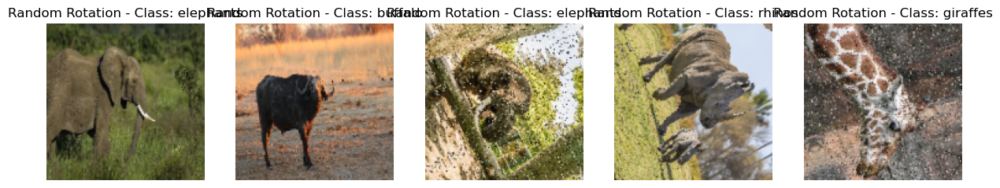

Training the model with Random Rotation Augmentation...
Epoch 1/10


C:\Users\kazan\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 5s 138ms/step - accuracy: 0.1877 - loss: 2.0796 - val_accuracy: 0.2570 - val_loss: 1.5115
Epoch 2/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 122ms/step - accuracy: 0.3130 - loss: 1.5258 - val_accuracy: 0.4134 - val_loss: 1.3143
Epoch 3/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - accuracy: 0.5344 - loss: 1.1067 - val_accuracy: 0.4022 - val_loss: 1.4933
Epoch 4/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - accuracy: 0.6512 - loss: 0.8796 - val_accuracy: 0.4693 - val_loss: 1.6264
Epoch 5/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - accuracy: 0.6810 - loss: 0.8083 - val_accuracy: 0.6089 - val_loss: 1.2439
Epoch 6/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - accuracy: 0.7729 - loss: 0.5693 - val_accuracy: 0.6592 - val_loss: 0.9164
Epoch 7/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - accuracy: 0.8573 - loss: 0.4029 - val_accuracy: 0.6257 - val_loss: 1.4779
Epoch 8/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - accuracy: 0.8954 - loss: 0.3089 - val_accuracy: 0.6425 - val_

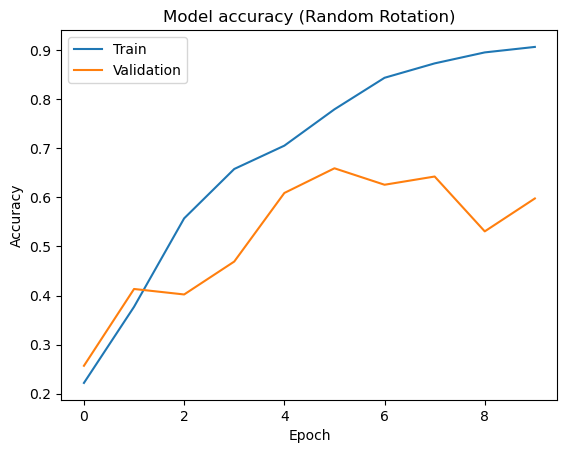

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


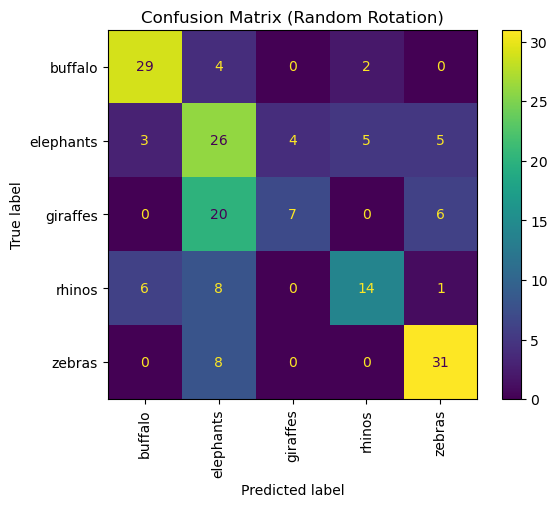

Classification Report (Random Rotation):

              precision    recall  f1-score   support

     buffalo       0.76      0.83      0.79        35
   elephants       0.39      0.60      0.48        43
    giraffes       0.64      0.21      0.32        33
      rhinos       0.67      0.48      0.56        29
      zebras       0.72      0.79      0.76        39

    accuracy                           0.60       179
   macro avg       0.64      0.58      0.58       179
weighted avg       0.63      0.60      0.58       179



In [20]:
# Random Rotation Augmentation
data_rotation = tf.keras.Sequential([
    layers.RandomRotation(0.2)  # Random rotations up to 20%
])

# Applying Random Rotation Augmentation to the oversampled dataset
print("Applying Random Rotation Augmentation to the oversampled dataset...")
augmented_images_rotation = []
augmented_labels_rotation = []

for img, label in zip(X_train_balanced, y_train_balanced):
    img_augmented = data_rotation(tf.expand_dims(img, axis=0))[0].numpy()
    augmented_images_rotation.append(img_augmented)
    augmented_labels_rotation.append(label)

# Converting to NumPy arrays
X_train_rotation = np.array(augmented_images_rotation)
y_train_rotation = np.array(augmented_labels_rotation)

# Visualizing Random Rotation Augmentation
print("Visualizing Random Rotation Augmentation...")
plt.figure(figsize=(15, 10))
for i in range(5):  # Display 5 examples
    idx = np.random.randint(len(X_train_rotation))
    plt.subplot(1, 5, i + 1)
    plt.imshow(X_train_rotation[idx])
    plt.title(f"Random Rotation - Class: {classes[y_train_rotation[idx]]}")
    plt.axis("off")
plt.show()

# Training the model with Random Rotation Augmentation
print("Training the model with Random Rotation Augmentation...")
model_rotation = create_model()
history_rotation = model_rotation.fit(X_train_rotation, y_train_rotation, epochs=10, validation_data=(X_test_balanced, y_test_balanced))

# Evaluating the model
test_loss_rotation, test_acc_rotation = model_rotation.evaluate(X_test_balanced, y_test_balanced)
print(f'\nTest accuracy (Random Rotation): {test_acc_rotation}')

# Plotting the training and validation accuracy
plt.plot(history_rotation.history['accuracy'])
plt.plot(history_rotation.history['val_accuracy'])
plt.title('Model accuracy (Random Rotation)')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Predictions on the test dataset
y_pred_rotation = np.argmax(model_rotation.predict(X_test_balanced), axis=1)

# Confusion Matrix for test data
cm_rotation = confusion_matrix(y_test_balanced, y_pred_rotation)

# Displaying confusion matrix
disp_rotation = ConfusionMatrixDisplay(confusion_matrix=cm_rotation, display_labels=classes)
disp_rotation.plot(cmap='viridis', xticks_rotation='vertical')
plt.title('Confusion Matrix (Random Rotation)')
plt.show()

# Classification Report
report_rotation = classification_report(y_test_balanced, y_pred_rotation, target_names=classes)
print("Classification Report (Random Rotation):\n")
print(report_rotation)

### Creating a new model with Random Contrast Augmentation

Applying Random Contrast Augmentation to the training dataset...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Visualizing Random Contrast Augmentation...


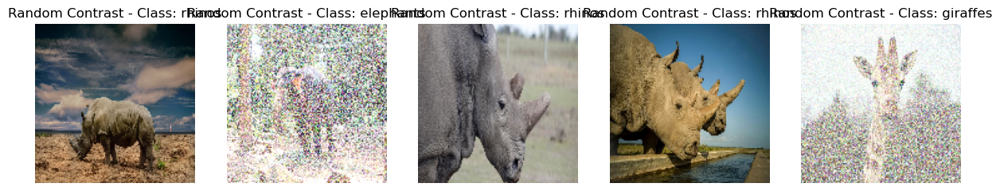

Training the model with Random Contrast Augmentation...
Epoch 1/10


C:\Users\kazan\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - accuracy: 0.2852 - loss: 1.8660 - val_accuracy: 0.6425 - val_loss: 0.9624
Epoch 2/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - accuracy: 0.6232 - loss: 0.9842 - val_accuracy: 0.6983 - val_loss: 0.7775
Epoch 3/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - accuracy: 0.7627 - loss: 0.6433 - val_accuracy: 0.7542 - val_loss: 0.6296
Epoch 4/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - accuracy: 0.8794 - loss: 0.3514 - val_accuracy: 0.8771 - val_loss: 0.4129
Epoch 5/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - accuracy: 0.9344 - loss: 0.2357 - val_accuracy: 0.8547 - val_loss: 0.4414
Epoch 6/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - accuracy: 0.9597 - loss: 0.1406 - val_accuracy: 0.8883 - val_loss: 0.3331
Epoch 7/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 135ms/step - accuracy: 0.9800 - loss: 0.0752 - val_accuracy: 0.8883 - val_loss: 0.3929
Epoch 8/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - accuracy: 0.9910 - loss: 0.0429 - val_accuracy: 0.8883 - val_

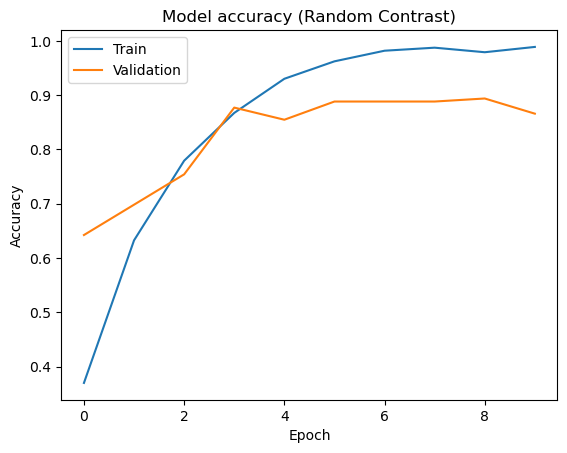

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


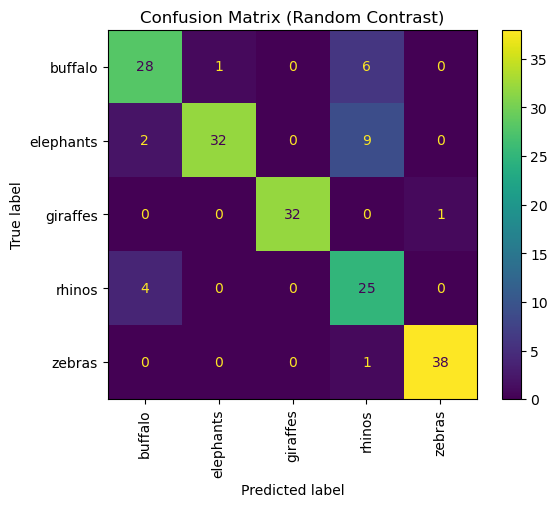

Classification Report (Random Contrast):

              precision    recall  f1-score   support

     buffalo       0.82      0.80      0.81        35
   elephants       0.97      0.74      0.84        43
    giraffes       1.00      0.97      0.98        33
      rhinos       0.61      0.86      0.71        29
      zebras       0.97      0.97      0.97        39

    accuracy                           0.87       179
   macro avg       0.88      0.87      0.87       179
weighted avg       0.89      0.87      0.87       179



In [21]:
# Random Contrast Augmentation
data_contrast = tf.keras.Sequential([layers.RandomContrast(0.2)])

# Augmenting the dataset with Random Contrast
augmented_images_contrast = []
augmented_labels_contrast = []

print("Applying Random Contrast Augmentation to the training dataset...")
for img, label in zip(X_train_balanced, y_train_balanced):
    img_augmented = data_contrast(tf.expand_dims(img, axis=0))[0].numpy()
    augmented_images_contrast.append(img_augmented)
    augmented_labels_contrast.append(label)

# Converting to NumPy arrays
X_train_contrast = np.array(augmented_images_contrast)
y_train_contrast = np.array(augmented_labels_contrast)

# Visualizing Random Contrast Augmentation
print("Visualizing Random Contrast Augmentation...")
plt.figure(figsize=(15, 10))
for i in range(5):  # Display 5 examples
    idx = np.random.randint(len(X_train_contrast))  # Randomly pick an augmented image
    plt.subplot(1, 5, i + 1)
    plt.imshow(X_train_contrast[idx])
    plt.title(f"Random Contrast - Class: {classes[y_train_contrast[idx]]}")
    plt.axis("off")
plt.show()

# Training the model with Random Contrast Augmentation
print("Training the model with Random Contrast Augmentation...")
model_contrast = create_model()
history_contrast = model_contrast.fit(
    X_train_contrast, y_train_contrast, epochs=10, validation_data=(X_test_balanced, y_test_balanced)
)

# Evaluating the model
test_loss_contrast, test_acc_contrast = model_contrast.evaluate(X_test_balanced, y_test_balanced)
print(f'\nTest accuracy (Random Contrast): {test_acc_contrast}')

# Plotting the training and validation accuracy
plt.plot(history_contrast.history['accuracy'])
plt.plot(history_contrast.history['val_accuracy'])
plt.title('Model accuracy (Random Contrast)')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Predictions on the test dataset
y_pred_contrast = np.argmax(model_contrast.predict(X_test_balanced), axis=1)

# Confusion Matrix for test data
cm_contrast = confusion_matrix(y_test_balanced, y_pred_contrast)

# Displaying the confusion matrix
disp_contrast = ConfusionMatrixDisplay(confusion_matrix=cm_contrast, display_labels=classes)
disp_contrast.plot(cmap='viridis', xticks_rotation='vertical')
plt.title('Confusion Matrix (Random Contrast)')
plt.show()

# Classification Report
report_contrast = classification_report(y_test_balanced, y_pred_contrast, target_names=classes)
print("Classification Report (Random Contrast):\n")
print(report_contrast)

### Creating a new model with combined augmentations (Flip, Rotation, Contrast)

Applying Combined Augmentations to the training dataset...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Visualizing Combined Augmentations...


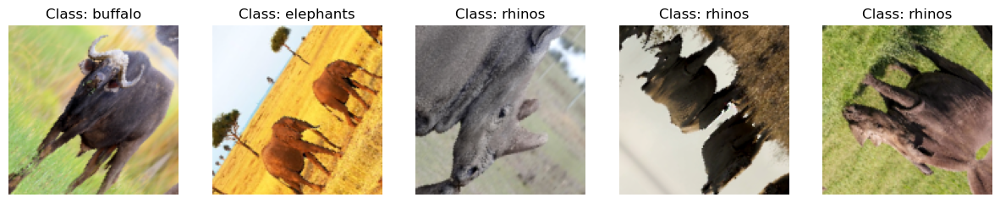

Training the model with Combined Augmentations...
Epoch 1/10


C:\Users\kazan\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 5s 140ms/step - accuracy: 0.2221 - loss: 2.0803 - val_accuracy: 0.1844 - val_loss: 1.5635
Epoch 2/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - accuracy: 0.3473 - loss: 1.4516 - val_accuracy: 0.4413 - val_loss: 1.2518
Epoch 3/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - accuracy: 0.6001 - loss: 1.0232 - val_accuracy: 0.5922 - val_loss: 1.0239
Epoch 4/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - accuracy: 0.6690 - loss: 0.8735 - val_accuracy: 0.5642 - val_loss: 1.0245
Epoch 5/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 121ms/step - accuracy: 0.7374 - loss: 0.7256 - val_accuracy: 0.6313 - val_loss: 0.9458
Epoch 6/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 122ms/step - accuracy: 0.7806 - loss: 0.5731 - val_accuracy: 0.5587 - val_loss: 1.2525
Epoch 7/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - accuracy: 0.8506 - loss: 0.4049 - val_accuracy: 0.5419 - val_loss: 1.4275
Epoch 8/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - accuracy: 0.8855 - loss: 0.3033 - val_accuracy: 0.5587 - val_

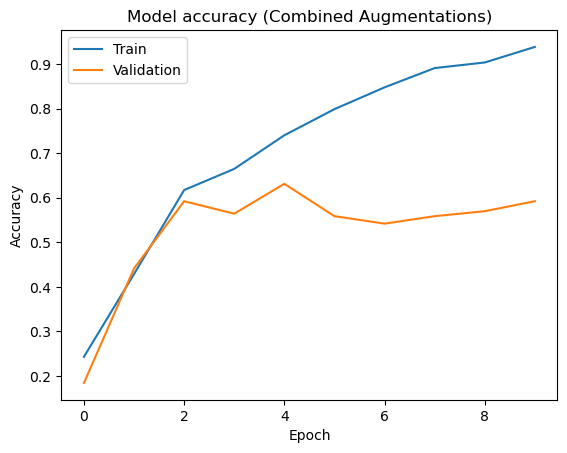

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


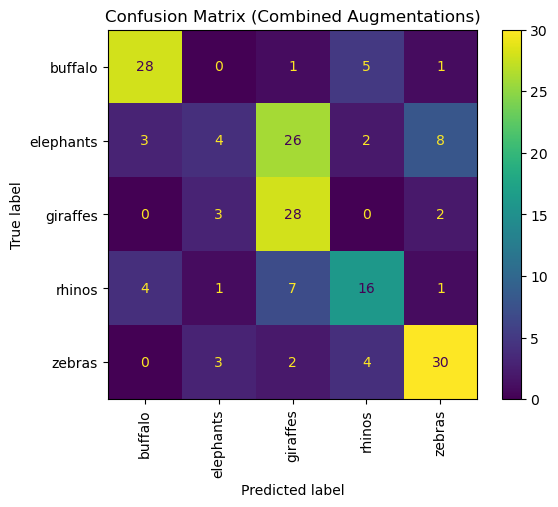

Classification Report (Combined Augmentations):

              precision    recall  f1-score   support

     buffalo       0.80      0.80      0.80        35
   elephants       0.36      0.09      0.15        43
    giraffes       0.44      0.85      0.58        33
      rhinos       0.59      0.55      0.57        29
      zebras       0.71      0.77      0.74        39

    accuracy                           0.59       179
   macro avg       0.58      0.61      0.57       179
weighted avg       0.58      0.59      0.55       179



In [22]:
# Combined Flip, Rotation, and Contrast Augmentation
data_combined = tf.keras.Sequential([
    layers.RandomFlip("horizontal_and_vertical"),  # Random Flip
    layers.RandomRotation(0.2),                    # Random Rotation
    layers.RandomContrast(0.2)                     # Random Contrast
])

# Augmenting the dataset with combined augmentations
augmented_images_combined = []
augmented_labels_combined = []

print("Applying Combined Augmentations to the training dataset...")
for img, label in zip(X_train_balanced, y_train_balanced):  # Use oversampled training data
    img_augmented = data_combined(tf.expand_dims(img, axis=0))[0].numpy()  # Apply augmentations
    augmented_images_combined.append(img_augmented)
    augmented_labels_combined.append(label)

# Converting augmented data to NumPy arrays
X_train_combined = np.array(augmented_images_combined)
y_train_combined = np.array(augmented_labels_combined)

# Visualizing Combined Augmentations
print("Visualizing Combined Augmentations...")
plt.figure(figsize=(15, 10))
for i in range(5):  # Display 5 examples
    idx = np.random.randint(len(X_train_combined))
    plt.subplot(1, 5, i + 1)
    plt.imshow(X_train_combined[idx])
    plt.title(f"Class: {classes[y_train_combined[idx]]}")
    plt.axis("off")
plt.show()

# Training the model with Combined Augmentations
print("Training the model with Combined Augmentations...")
model_combined = create_model()
history_combined = model_combined.fit(
    X_train_combined, y_train_combined, epochs=10, validation_data=(X_test_balanced, y_test_balanced)
)

# Evaluating the model
test_loss_combined, test_acc_combined = model_combined.evaluate(X_test_balanced, y_test_balanced)
print(f'\nTest accuracy (Combined Augmentations): {test_acc_combined}')

# Plotting training and validation accuracy
plt.plot(history_combined.history['accuracy'])
plt.plot(history_combined.history['val_accuracy'])
plt.title('Model accuracy (Combined Augmentations)')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Predictions on the test dataset
y_pred_combined = np.argmax(model_combined.predict(X_test_balanced), axis=1)

# Computing the confusion matrix
cm_combined = confusion_matrix(y_test_balanced, y_pred_combined)

# Displaying the confusion matrix
disp_combined = ConfusionMatrixDisplay(confusion_matrix=cm_combined, display_labels=classes)
disp_combined.plot(cmap='viridis', xticks_rotation='vertical')
plt.title('Confusion Matrix (Combined Augmentations)')
plt.show()

# Classification Report
report_combined = classification_report(y_test_balanced, y_pred_combined, target_names=classes)
print("Classification Report (Combined Augmentations):\n")
print(report_combined)

### Creating a new model with combined augmentations Gaussian Noise and Random Contrast

Applying Gaussian Noise + Random Contrast Augmentation...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Visualizing Gaussian Noise + Random Contrast Augmentation:


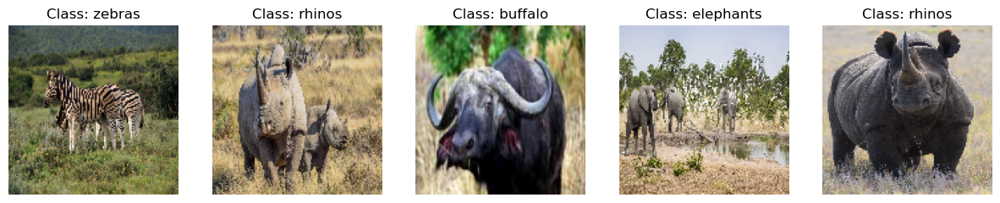

Training the model on Gaussian Noise + Random Contrast Augmentation...
Epoch 1/10


C:\Users\kazan\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 6s 147ms/step - accuracy: 0.1947 - loss: 2.1748 - val_accuracy: 0.3911 - val_loss: 1.5322
Epoch 2/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - accuracy: 0.4398 - loss: 1.3223 - val_accuracy: 0.6983 - val_loss: 0.8766
Epoch 3/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 134ms/step - accuracy: 0.6768 - loss: 0.8319 - val_accuracy: 0.7318 - val_loss: 0.7030
Epoch 4/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 134ms/step - accuracy: 0.8031 - loss: 0.5126 - val_accuracy: 0.8045 - val_loss: 0.5475
Epoch 5/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - accuracy: 0.8855 - loss: 0.3416 - val_accuracy: 0.8883 - val_loss: 0.3960
Epoch 6/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - accuracy: 0.9285 - loss: 0.2629 - val_accuracy: 0.8659 - val_loss: 0.3912
Epoch 7/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - accuracy: 0.9570 - loss: 0.1638 - val_accuracy: 0.8771 - val_loss: 0.3603
Epoch 8/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - accuracy: 0.9676 - loss: 0.1136 - val_accuracy: 0.8492 - val_

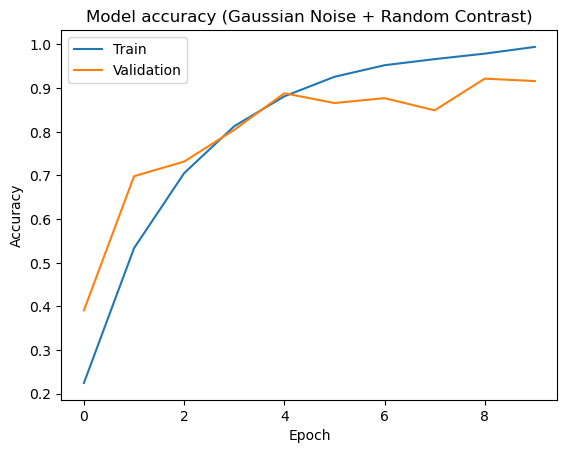

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


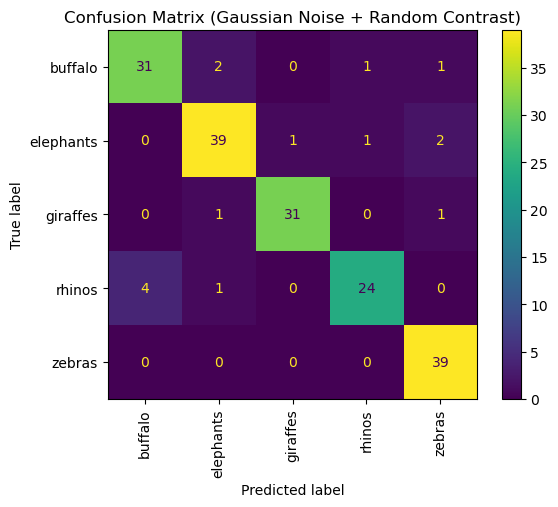

Classification Report (Gaussian Noise + Random Contrast):

              precision    recall  f1-score   support

     buffalo       0.89      0.89      0.89        35
   elephants       0.91      0.91      0.91        43
    giraffes       0.97      0.94      0.95        33
      rhinos       0.92      0.83      0.87        29
      zebras       0.91      1.00      0.95        39

    accuracy                           0.92       179
   macro avg       0.92      0.91      0.91       179
weighted avg       0.92      0.92      0.92       179



In [23]:
# Define Gaussian Noise and Random Contrast Augmentation Pipeline
data_gaussian_contrast = tf.keras.Sequential([
    layers.GaussianNoise(0.1),  # Gaussian noise with standard deviation of 0.1
    layers.RandomContrast(0.2)  # Random contrast adjustment with a factor of 0.2
])

# Applying Gaussian Noise + Random Contrast Augmentations to the Oversampled Dataset
augmented_images_mix = []
augmented_labels_mix = []

print("Applying Gaussian Noise + Random Contrast Augmentation...")
for img, label in zip(X_train_balanced, y_train_balanced):
    img_augmented = data_gaussian_contrast(tf.expand_dims(img, axis=0))[0].numpy()
    augmented_images_mix.append(img_augmented)
    augmented_labels_mix.append(label)

# Converting to NumPy arrays
X_train_mix = np.array(augmented_images_mix)
y_train_mix = np.array(augmented_labels_mix)

# Visualizing Augmented Samples
print("Visualizing Gaussian Noise + Random Contrast Augmentation:")
plt.figure(figsize=(15, 10))
for i in range(5):  # Display 5 random samples
    idx = np.random.randint(len(X_train_mix))
    plt.subplot(1, 5, i + 1)
    plt.imshow(X_train_mix[idx])
    plt.title(f"Class: {classes[y_train_mix[idx]]}")
    plt.axis("off")
plt.show()

# Training the Model on Augmented Dataset
print("Training the model on Gaussian Noise + Random Contrast Augmentation...")
model_mix = create_model()
history_mix = model_mix.fit(X_train_mix, y_train_mix, epochs=10, validation_data=(X_test_balanced, y_test_balanced))

# Evaluating the Model
test_loss_mix, test_acc_mix = model_mix.evaluate(X_test_balanced, y_test_balanced)
print(f'\nTest accuracy (Gaussian Noise + Random Contrast): {test_acc_mix}')

# Plotting Training and Validation Accuracy
plt.plot(history_mix.history['accuracy'])
plt.plot(history_mix.history['val_accuracy'])
plt.title('Model accuracy (Gaussian Noise + Random Contrast)')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Predict and Evaluate Model on Test Dataset
y_pred_mix = np.argmax(model_mix.predict(X_test_balanced), axis=1)

# Confusion Matrix
cm_mix = confusion_matrix(y_test_balanced, y_pred_mix)

# Displaying Confusion Matrix
disp_mix = ConfusionMatrixDisplay(confusion_matrix=cm_mix, display_labels=classes)
disp_mix.plot(cmap='viridis', xticks_rotation='vertical')
plt.title('Confusion Matrix (Gaussian Noise + Random Contrast)')
plt.show()

# Classification Report
report_mix = classification_report(y_test_balanced, y_pred_mix, target_names=classes)
print("Classification Report (Gaussian Noise + Random Contrast):\n")
print(report_mix)

# Focusing on Dificult  Classes

### Applaying ImageDataGenerator for targeted augmentation

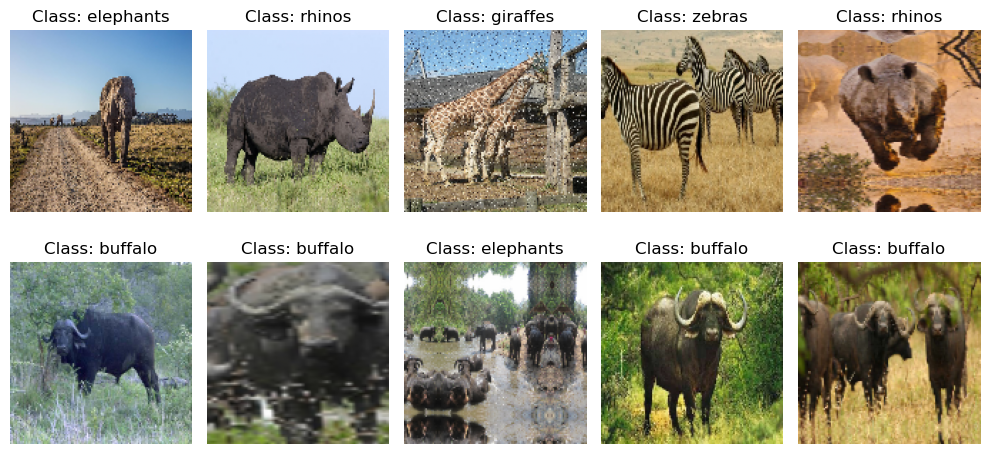

Training the model with targeted augmentation for elephants, rhinos, and buffalo...


C:\Users\kazan\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - accuracy: 0.3099 - loss: 1.8012 - val_accuracy: 0.6536 - val_loss: 0.8768
Epoch 2/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - accuracy: 0.6524 - loss: 0.8849 - val_accuracy: 0.7486 - val_loss: 0.6997
Epoch 3/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - accuracy: 0.7094 - loss: 0.6968 - val_accuracy: 0.7821 - val_loss: 0.6556
Epoch 4/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 6s 117ms/step - accuracy: 0.7740 - loss: 0.5720 - val_accuracy: 0.8324 - val_loss: 0.5368
Epoch 5/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - accuracy: 0.8287 - loss: 0.4590 - val_accuracy: 0.8101 - val_loss: 0.5694
Epoch 6/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - accuracy: 0.8387 - loss: 0.4387 - val_accuracy: 0.8603 - val_loss: 0.5086
Epoch 7/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - accuracy: 0.8829 - loss: 0.3446 - val_accuracy: 0.8547 - val_loss: 0.4570
Epoch 8/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - accuracy: 0.9247 - loss: 0.2220 - val_accuracy: 0.

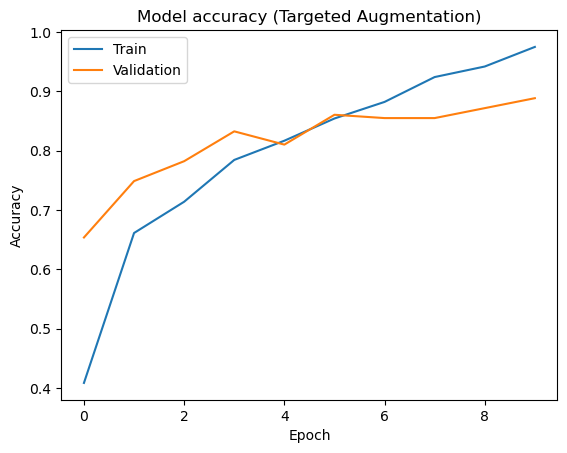

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


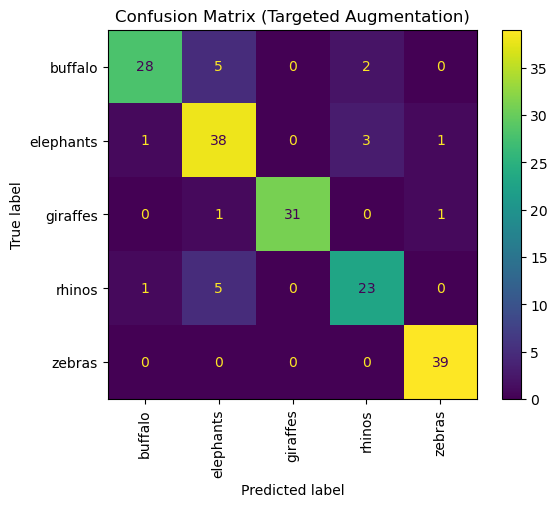

Classification Report (Targeted Augmentation):

              precision    recall  f1-score   support

     buffalo       0.93      0.80      0.86        35
   elephants       0.78      0.88      0.83        43
    giraffes       1.00      0.94      0.97        33
      rhinos       0.82      0.79      0.81        29
      zebras       0.95      1.00      0.97        39

    accuracy                           0.89       179
   macro avg       0.90      0.88      0.89       179
weighted avg       0.89      0.89      0.89       179



In [25]:
# Define ImageDataGenerator for targeted augmentation
elephant_datagen = ImageDataGenerator(
    rotation_range=7,
    width_shift_range=0.05,
    height_shift_range=0.05,
    zoom_range=1,
    horizontal_flip=True,
    fill_mode='reflect'
)

rhino_datagen = ImageDataGenerator(
    rotation_range=5,
    width_shift_range=0.05,
    height_shift_range=0.05,
    zoom_range=1,
    horizontal_flip=True,
    fill_mode='reflect'
)

buffalo_datagen = ImageDataGenerator(
    rotation_range=6,
    width_shift_range=0.05,
    height_shift_range=0.05,
    zoom_range=1,
    horizontal_flip=True,
    fill_mode='reflect'
)

# Filtering images for "elephants", "rhinos", and "buffalo"
elephant_indices = [i for i, label in enumerate(y_train_balanced) if label == classes.index("elephants")]
rhino_indices = [i for i, label in enumerate(y_train_balanced) if label == classes.index("rhinos")]
buffalo_indices = [i for i, label in enumerate(y_train_balanced) if label == classes.index("buffalo")]

elephant_images = X_train_balanced[elephant_indices]
rhino_images = X_train_balanced[rhino_indices]
buffalo_images = X_train_balanced[buffalo_indices]

# Augmenting elephant images
augmented_elephants = []
for batch in elephant_datagen.flow(elephant_images, batch_size=len(elephant_images), shuffle=False):
    augmented_elephants.extend(batch)
    if len(augmented_elephants) >= len(elephant_images) * 2:  # Generate 2x data
        break
augmented_elephants = np.array(augmented_elephants[:len(elephant_images) * 2])

# Augmenting rhino images
augmented_rhinos = []
for batch in rhino_datagen.flow(rhino_images, batch_size=len(rhino_images), shuffle=False):
    augmented_rhinos.extend(batch)
    if len(augmented_rhinos) >= len(rhino_images) * 2:  # Generate 2x data
        break
augmented_rhinos = np.array(augmented_rhinos[:len(rhino_images) * 2])

# Augmenting buffalo images
augmented_buffalo = []
for batch in buffalo_datagen.flow(buffalo_images, batch_size=len(buffalo_images), shuffle=False):
    augmented_buffalo.extend(batch)
    if len(augmented_buffalo) >= len(buffalo_images) * 2:  # Generate 2x data
        break
augmented_buffalo = np.array(augmented_buffalo[:len(buffalo_images) * 2])

# Combining augmented data back into training data
X_train_augmented = np.concatenate([X_train_balanced, augmented_elephants, augmented_rhinos, augmented_buffalo], axis=0)
y_train_augmented = np.concatenate([
    y_train_balanced,
    [classes.index("elephants")] * len(augmented_elephants),
    [classes.index("rhinos")] * len(augmented_rhinos),
    [classes.index("buffalo")] * len(augmented_buffalo)
], axis=0)

# Shuffle the augmented dataset
shuffle_indices = np.random.permutation(len(X_train_augmented))
X_train_augmented = X_train_augmented[shuffle_indices]
y_train_augmented = y_train_augmented[shuffle_indices]

# Visualizing some augmented samples
plt.figure(figsize=(10, 5))
for i in range(10):
    idx = np.random.randint(len(X_train_augmented))
    plt.subplot(2, 5, i + 1)
    plt.imshow(X_train_augmented[idx])
    plt.title(f"Class: {classes[y_train_augmented[idx]]}")
    plt.axis("off")
plt.tight_layout()
plt.show()

# Training the model with the augmented dataset
print("Training the model with targeted augmentation for elephants, rhinos, and buffalo...")
model_targeted_aug = create_model()  # Use the pre-defined base model
history_targeted_aug = model_targeted_aug.fit(
    X_train_augmented, y_train_augmented, epochs=10, validation_data=(X_test_balanced, y_test_balanced)
)

# Evaluateing the model
test_loss_targeted, test_acc_targeted = model_targeted_aug.evaluate(X_test_balanced, y_test_balanced, verbose=2)
print(f'\nTest accuracy (Targeted Augmentation): {test_acc_targeted}')

# Plot training and validation accuracy
plt.plot(history_targeted_aug.history['accuracy'])
plt.plot(history_targeted_aug.history['val_accuracy'])
plt.title('Model accuracy (Targeted Augmentation)')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Predict and evaluate
y_pred_targeted = np.argmax(model_targeted_aug.predict(X_test_balanced), axis=1)
cm_targeted = confusion_matrix(y_test_balanced, y_pred_targeted)
disp_targeted = ConfusionMatrixDisplay(confusion_matrix=cm_targeted, display_labels=classes)
disp_targeted.plot(cmap='viridis', xticks_rotation='vertical')
plt.title('Confusion Matrix (Targeted Augmentation)')
plt.show()

report_targeted = classification_report(y_test_balanced, y_pred_targeted, target_names=classes)
print("Classification Report (Targeted Augmentation):\n")
print(report_targeted)

### Combining ImageDataGenerator for targeted augmentation with Gaussian Noise

Adding Gaussian Noise to the dataset...


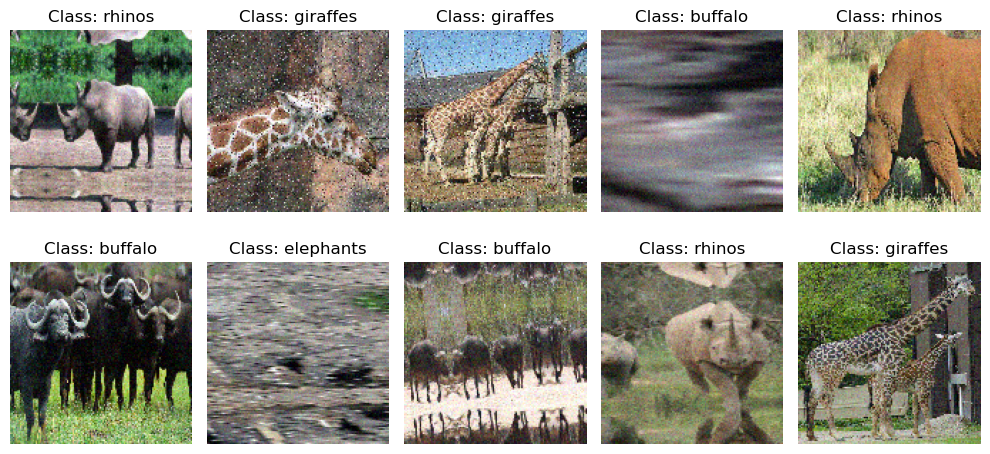

Training the model with augmented data including Gaussian Noise...


C:\Users\kazan\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 9s 137ms/step - accuracy: 0.3169 - loss: 2.2764 - val_accuracy: 0.4581 - val_loss: 1.3352
Epoch 2/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - accuracy: 0.5317 - loss: 1.1425 - val_accuracy: 0.6313 - val_loss: 1.0095
Epoch 3/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - accuracy: 0.6800 - loss: 0.8171 - val_accuracy: 0.7709 - val_loss: 0.6527
Epoch 4/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - accuracy: 0.7223 - loss: 0.7116 - val_accuracy: 0.6592 - val_loss: 0.8490
Epoch 5/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - accuracy: 0.8000 - loss: 0.5237 - val_accuracy: 0.7821 - val_loss: 0.6027
Epoch 6/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - accuracy: 0.8724 - loss: 0.3729 - val_accuracy: 0.8156 - val_loss: 0.4832
Epoch 7/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - accuracy: 0.8954 - loss: 0.3226 - val_accuracy: 0.8492 - val_loss: 0.4589
Epoch 8/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - accuracy: 0.9416 - loss: 0.1900 - val_accuracy: 0.

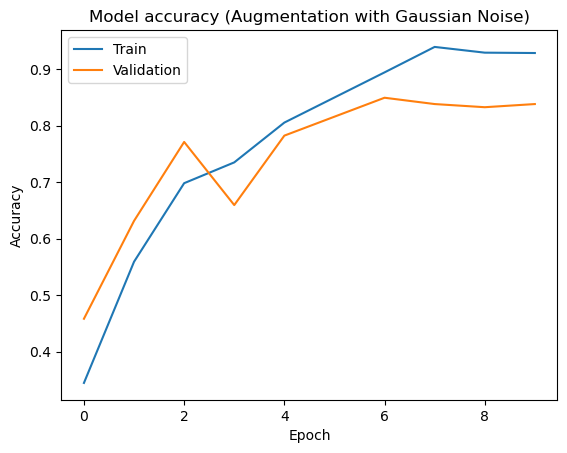

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


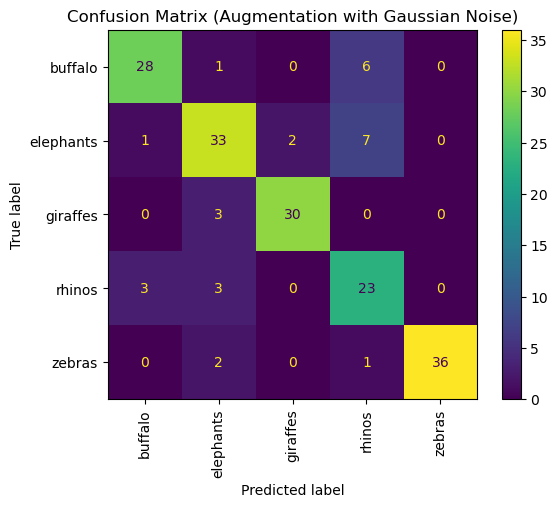

Classification Report (Augmentation with Gaussian Noise):

              precision    recall  f1-score   support

     buffalo       0.88      0.80      0.84        35
   elephants       0.79      0.77      0.78        43
    giraffes       0.94      0.91      0.92        33
      rhinos       0.62      0.79      0.70        29
      zebras       1.00      0.92      0.96        39

    accuracy                           0.84       179
   macro avg       0.84      0.84      0.84       179
weighted avg       0.85      0.84      0.84       179



In [26]:
# Define ImageDataGenerator for targeted augmentation
elephant_datagen = ImageDataGenerator(
    rotation_range=7,
    width_shift_range=0.05,
    height_shift_range=0.05,
    zoom_range=1,
    horizontal_flip=True,
    fill_mode='reflect'
)

rhino_datagen = ImageDataGenerator(
    rotation_range=5,
    width_shift_range=0.05,
    height_shift_range=0.05,
    zoom_range=1,
    horizontal_flip=True,
    fill_mode='reflect'
)

buffalo_datagen = ImageDataGenerator(
    rotation_range=6,
    width_shift_range=0.05,
    height_shift_range=0.05,
    zoom_range=1,
    horizontal_flip=True,
    fill_mode='reflect'
)

# Filtering images for "elephants", "rhinos", and "buffalo"
elephant_indices = [i for i, label in enumerate(y_train_balanced) if label == classes.index("elephants")]
rhino_indices = [i for i, label in enumerate(y_train_balanced) if label == classes.index("rhinos")]
buffalo_indices = [i for i, label in enumerate(y_train_balanced) if label == classes.index("buffalo")]

elephant_images = X_train_balanced[elephant_indices]
rhino_images = X_train_balanced[rhino_indices]
buffalo_images = X_train_balanced[buffalo_indices]

# Augmenting elephant images
augmented_elephants = []
for batch in elephant_datagen.flow(elephant_images, batch_size=len(elephant_images), shuffle=False):
    augmented_elephants.extend(batch)
    if len(augmented_elephants) >= len(elephant_images) * 2:  # Generate 2x data
        break
augmented_elephants = np.array(augmented_elephants[:len(elephant_images) * 2])

# Augmenting rhino images
augmented_rhinos = []
for batch in rhino_datagen.flow(rhino_images, batch_size=len(rhino_images), shuffle=False):
    augmented_rhinos.extend(batch)
    if len(augmented_rhinos) >= len(rhino_images) * 2:  # Generate 2x data
        break
augmented_rhinos = np.array(augmented_rhinos[:len(rhino_images) * 2])

# Augmenting buffalo images
augmented_buffalo = []
for batch in buffalo_datagen.flow(buffalo_images, batch_size=len(buffalo_images), shuffle=False):
    augmented_buffalo.extend(batch)
    if len(augmented_buffalo) >= len(buffalo_images) * 2:  # Generate 2x data
        break
augmented_buffalo = np.array(augmented_buffalo[:len(buffalo_images) * 2])

# Combining augmented data back into training data
X_train_augmented = np.concatenate([X_train_balanced, augmented_elephants, augmented_rhinos, augmented_buffalo], axis=0)
y_train_augmented = np.concatenate([
    y_train_balanced,
    [classes.index("elephants")] * len(augmented_elephants),
    [classes.index("rhinos")] * len(augmented_rhinos),
    [classes.index("buffalo")] * len(augmented_buffalo)
], axis=0)

# Adding Gaussian Noise to the dataset
print("Adding Gaussian Noise to the dataset...")
noise = np.random.normal(0, 0.05, X_train_augmented.shape)  # Mean 0, std dev 0.05
X_train_augmented_noise = np.clip(X_train_augmented + noise, 0, 1)  # Ensure pixel values are in range [0, 1]

# Shuffle the augmented dataset with noise
shuffle_indices = np.random.permutation(len(X_train_augmented_noise))
X_train_augmented_noise = X_train_augmented_noise[shuffle_indices]
y_train_augmented = y_train_augmented[shuffle_indices]

# Visualize some augmented samples with noise
plt.figure(figsize=(10, 5))
for i in range(10):
    idx = np.random.randint(len(X_train_augmented_noise))
    plt.subplot(2, 5, i + 1)
    plt.imshow(X_train_augmented_noise[idx])
    plt.title(f"Class: {classes[y_train_augmented[idx]]}")
    plt.axis("off")
plt.tight_layout()
plt.show()

# Training the model with the augmented dataset including Gaussian Noise
print("Training the model with augmented data including Gaussian Noise...")
model_gaussian_aug = create_model()  # Use the pre-defined base model
history_gaussian_aug = model_gaussian_aug.fit(
    X_train_augmented_noise, y_train_augmented, epochs=10, validation_data=(X_test_balanced, y_test_balanced)
)

# Evaluating the model
test_loss_gaussian, test_acc_gaussian = model_gaussian_aug.evaluate(X_test_balanced, y_test_balanced, verbose=2)
print(f'\nTest accuracy (Augmentation with Gaussian Noise): {test_acc_gaussian}')

# Plot training and validation accuracy
plt.plot(history_gaussian_aug.history['accuracy'])
plt.plot(history_gaussian_aug.history['val_accuracy'])
plt.title('Model accuracy (Augmentation with Gaussian Noise)')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Predict and evaluate
y_pred_gaussian = np.argmax(model_gaussian_aug.predict(X_test_balanced), axis=1)
cm_gaussian = confusion_matrix(y_test_balanced, y_pred_gaussian)
disp_gaussian = ConfusionMatrixDisplay(confusion_matrix=cm_gaussian, display_labels=classes)
disp_gaussian.plot(cmap='viridis', xticks_rotation='vertical')
plt.title('Confusion Matrix (Augmentation with Gaussian Noise)')
plt.show()

report_gaussian = classification_report(y_test_balanced, y_pred_gaussian, target_names=classes)
print("Classification Report (Augmentation with Gaussian Noise):\n")
print(report_gaussian)

In [28]:
import pandas as pd

# Summarizing results
data = {
    "Augmentation Type": [
        "Baseline (No Augmentation)",
        "Oversampled Baseline",
        "Gaussian Noise",
        "Random Flip",
        "Random Rotation",
        "Random Contrast",
        "Combined Augmentations",
        "Gaussian Noise + Random Contrast",
        "Targeted Augmentation",
        "Targeted Augmentation with Gaussian Noise"
    ],
    "Accuracy": [0.65, 0.91, 0.89, 0.77, 0.60, 0.87, 0.59, 0.92, 0.89, 0.84],
    "Precision (macro avg)": [0.55, 0.90, 0.89, 0.76, 0.64, 0.88, 0.58, 0.92, 0.90, 0.84],
    "Recall (macro avg)": [0.55, 0.91, 0.89, 0.76, 0.58, 0.87, 0.61, 0.91, 0.88, 0.84],
    "F1-score (macro avg)": [0.54, 0.90, 0.89, 0.76, 0.58, 0.87, 0.57, 0.91, 0.89, 0.84]
}

# Converting the data to a DataFrame
results_df = pd.DataFrame(data)

# Displaying the DataFrame
results_df

,Augmentation Type,Accuracy,Precision (macro avg),Recall (macro avg),F1-score (macro avg)
0,Baseline (No Augmentation),0.65,0.55,0.55,0.54
1,Oversampled Baseline,0.91,0.90,0.91,0.90
2,Gaussian Noise,0.89,0.89,0.89,0.89
3,Random Flip,0.77,0.76,0.76,0.76
4,Random Rotation,0.60,0.64,0.58,0.58
5,Random Contrast,0.87,0.88,0.87,0.87
6,Combined Augmentations,0.59,0.58,0.61,0.57
7,Gaussian Noise + Random Contrast,0.92,0.92,0.91,0.91
8,Targeted Augmentation,0.89,0.90,0.88,0.89
9,Targeted Augmentation with Gaussian Noise,0.84,0.84,0.84,0.84
